# DV8  standard deviation
## standard deviation of (SST-SSTA), the detrending component

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import dask
import cartopy.feature as cfeature
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
import intake
import cartopy.crs as ccrs
from tempfile import TemporaryDirectory
from getpass import getuser
from pathlib import Path
from dask.distributed import Client, LocalCluster
import subprocess
import re
import cartopy.crs as ccrs
import warnings
warnings.filterwarnings('ignore')
import sys
sys.path.append('/home/b/b382616/notebooks_home/MHW/spot_the_blob')

import spot_the_blOb.hot_to_blOb as hot

import dask
from dask.distributed import Client, LocalCluster
import bokeh

dask.config.config.get('distributed').get('dashboard').update({'link':'{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'})
cluster = LocalCluster(n_workers=32, threads_per_worker=4)
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/b382616/levante-spawner-advanced//proxy/34423/status,
Dashboard: /user/b382616/levante-spawner-advanced//proxy/34423/status,Workers: 32
Total threads: 128,Total memory: 250.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:41221,Workers: 32
Dashboard: /user/b382616/levante-spawner-advanced//proxy/34423/status,Total threads: 128
Started: Just now,Total memory: 250.00 GiB
Comm: tcp://127.0.0.1:44929,Total threads: 4
Dashboard: /user/b382616/levante-spawner-advanced//proxy/40097/status,Memory: 7.81 GiB
Nanny: tcp://127.0.0.1:46437,


In [3]:
# OBSERVATION SSTA
chunk_size = {'time': 25, 'lat': -1, 'lon': -1}
scratch_dir = Path('/scratch') / getuser()[0] / getuser()
file_name = scratch_dir / 'mhws' / 'OSTIA_pre_1982_2014_shift_hob_maxanom5.zarr'
ds = xr.open_zarr(str(file_name), chunks=chunk_size)
ssta=ds['dat_anomaly']

In [4]:


# OBSERVATION SSTA
chunk_size = {'time': 25, 'lat': -1, 'lon': -1}
scratch_dir = Path('/scratch') / getuser()[0] / getuser()
file_name = scratch_dir / 'mhws' / '1982_2014_extremes_hob_ICONhist_maxanom5.zarr'
ds = xr.open_zarr(str(file_name), chunks=chunk_size)
issta=ds['dat_anomaly']

In [6]:
# OBSERVATION SST
cat = intake.open_catalog("https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/eerie.yaml")

dat = cat['dkrz.disk.observations.OSTIA.OSTIA.daily']#-output'][model][expid][version]['ocean'][gridspec]
sst = dat(chunks={}).to_dask()
sst=sst['sst'].coarsen(lat=5, lon=5,boundary='pad').mean()
sst=sst.isel(time=slice(0,13879))



In [5]:
ssta

<xarray.DataArray 'dat_anomaly' (time: 6573, lat: 720, lon: 1440)> Size: 27GB
dask.array<open_dataset-dat_anomaly, shape=(6573, 720, 1440), dtype=float32, chunksize=(25, 720, 1440), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 3kB -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 6kB -179.9 -179.6 -179.4 -179.1 ... 179.4 179.6 179.9
  * time     (time) datetime64[ns] 53kB 1997-01-01T12:00:00 ... 2014-12-30T12...

In [17]:
det=sst-ssta
det


<xarray.DataArray (time: 13879, lat: 720, lon: 1440)> Size: 115GB
dask.array<sub, shape=(13879, 720, 1440), dtype=float64, chunksize=(10, 240, 360), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 3kB -89.87 -89.62 -89.37 -89.12 ... 89.38 89.63 89.88
  * lon      (lon) float32 6kB -179.9 -179.6 -179.4 -179.1 ... 179.4 179.6 179.9
  * time     (time) datetime64[ns] 111kB 1982-01-01T12:00:00 ... 2019-12-31T1...

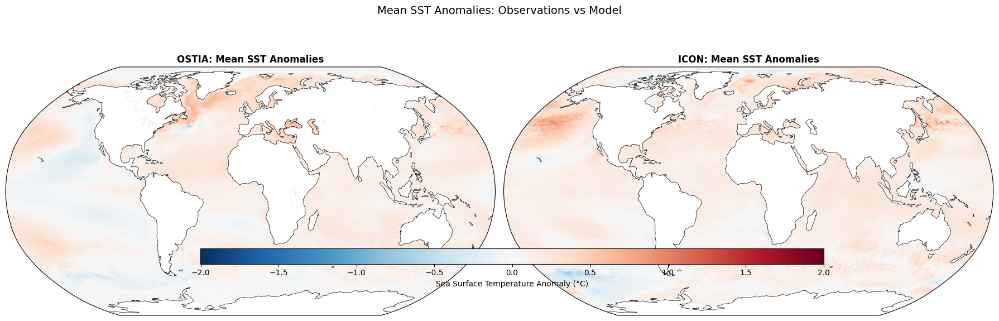

In [6]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

# Compute temporal mean of SST anomalies
ssta_mean = ssta.mean(dim='time')
issta_mean = issta.mean(dim='time')

# Create figure with two maps
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6),
                              subplot_kw={'projection': ccrs.Robinson()})

# Common settings
vmin = -2  # Adjust based on your data range
vmax = 2   # Adjust based on your data range
cmap = 'RdBu_r'

# Plot OSTIA mean anomalies
im1 = ssta_mean.plot(ax=ax1, transform=ccrs.PlateCarree(),
                    cmap=cmap, vmin=vmin, vmax=vmax,
                    add_colorbar=False)
ax1.coastlines(linewidth=0.5)
ax1.set_title('OSTIA: Mean SST Anomalies', fontsize=12, fontweight='bold')

# Plot ICON mean anomalies  
im2 = issta_mean.plot(ax=ax2, transform=ccrs.PlateCarree(),
                     cmap=cmap, vmin=vmin, vmax=vmax,
                     add_colorbar=False)
ax2.coastlines(linewidth=0.5)
ax2.set_title('ICON: Mean SST Anomalies', fontsize=12, fontweight='bold')

# Add single colorbar
cbar = plt.colorbar(im1, ax=[ax1, ax2], orientation='horizontal',
                   shrink=0.8, pad=0.05, aspect=40)
cbar.set_label('Sea Surface Temperature Anomaly (°C)', fontsize=10)

plt.suptitle('Mean SST Anomalies: Observations vs Model', fontsize=14, y=0.95)
plt.tight_layout()
plt.show()

In [12]:
def lon_180w_180e(ds_sice: xr.DataArray):
    ds_sice = (
        ds_sice
        .assign_coords(lon=lambda x: (x.lon - 180) % 360 - 180)
        .sortby('lon'))

    return ds_sice


issta_mean=lon_180w_180e(issta_mean)


TypeError: No numeric data to plot.

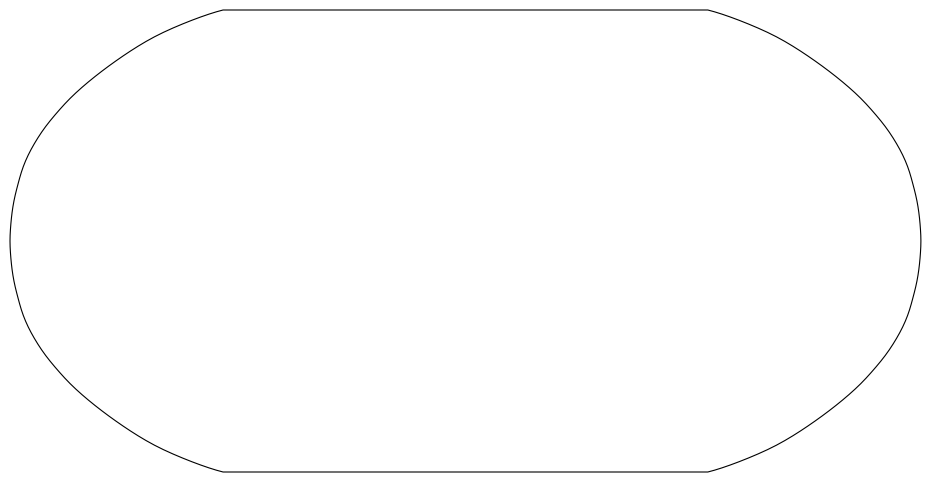

In [13]:
# Difference map (more concise)
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.Robinson()})

# Compute difference
difference = issta_mean - ssta_mean

# Plot
im = difference.plot(ax=ax, transform=ccrs.PlateCarree(),
                    cmap='RdBu_r', vmin=-1, vmax=1,  # Adjust range
                    add_colorbar=False)
ax.coastlines(linewidth=0.5)
ax.set_title('ICON - OSTIA: Model Bias in SST Anomalies', fontsize=12, fontweight='bold')

# Colorbar
cbar = plt.colorbar(im, ax=ax, orientation='horizontal', shrink=0.8, pad=0.05)
cbar.set_label('Model Bias (°C)', fontsize=10)

plt.tight_layout()
plt.show()

# SDV

In [19]:
det_sdv=det.std(dim='time', keep_attrs=True)

In [20]:
det_sdv

<xarray.DataArray (lat: 720, lon: 1440)> Size: 8MB
dask.array<_sqrt, shape=(720, 1440), dtype=float64, chunksize=(240, 360), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 3kB -89.87 -89.62 -89.37 -89.12 ... 89.38 89.63 89.88
  * lon      (lon) float32 6kB -179.9 -179.6 -179.4 -179.1 ... 179.4 179.6 179.9

In [21]:
det_sdv=det_sdv.compute()

/home/b/b382616/.local/lib/python3.9/site-packages/dask/array/numpy_compat.py:56: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


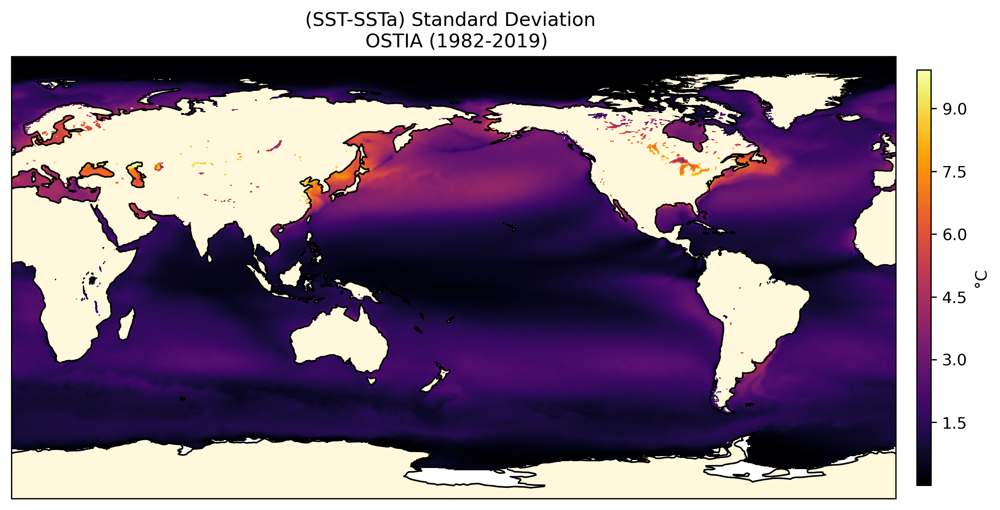

In [13]:


fig = plt.figure(figsize=(12, 6),dpi=300)
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))  
ax.set_global()  
ax.add_feature(cfeature.LAND, facecolor='cornsilk')

ax.coastlines()
pcm = ax.pcolormesh(det_sdv.lon, det_sdv.lat, det_sdv, cmap='inferno', vmax=9.921022,transform=ccrs.PlateCarree())


cbar = fig.colorbar(pcm, ax=ax, orientation="vertical", shrink=0.8, pad=0.02, aspect=30)

# Increase the number of ticks
cbar.set_ticks(ticker.MaxNLocator(nbins=8))  # Adjust nbins as needed

cbar.set_label("°C")

# Title
plt.title("(SST-SSTa) Standard Deviation \n OSTIA (1982-2019)")

plt.show()


# Seasonal SDV

## OBS

In [14]:

# Define trimesters and their months
trimesters = {
    'DJF': [12, 1, 2],
    'MAM': [3, 4, 5],
    'JJA': [6, 7, 8],
    'SON': [9, 10, 11]
}

# Calculate and save trimester standard deviations
for trm, months in trimesters.items():
    # Mask months while handling December (year boundary)
    ssta_trm = det.sel(time=det.time.dt.month.isin(months))
    std_trm = ssta_trm.std(dim='time', keep_attrs=True)
    std_trm=std_trm.to_netcdf(f'ssta_std_obs_{trm}.nc')



# Load precomputed standard deviations
std_djf_obs = xr.open_dataarray('detr_std_obs_DJF.nc')
std_djf_obs=std_djf_obs.compute()
std_mam_obs = xr.open_dataarray('detr_std_obs_MAM.nc')
std_mam_obs=std_mam_obs.compute()
std_jja_obs = xr.open_dataarray('detr_std_obs_JJA.nc')
std_jja_obs=std_jja_obs.compute()
std_son_obs = xr.open_dataarray('detr_std_obs_SON.nc')
std_son_obs=std_son_obs.compute()


/home/b/b382616/.local/lib/python3.9/site-packages/dask/array/numpy_compat.py:56: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/b/b382616/.local/lib/python3.9/site-packages/dask/array/numpy_compat.py:56: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/b/b382616/.local/lib/python3.9/site-packages/dask/array/numpy_compat.py:56: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/b/b382616/.local/lib/python3.9/site-packages/dask/array/numpy_compat.py:56: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/b/b382616/.local/lib/python3.9/site-packages/dask/array/numpy_compat.py:56: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/b/b382616/.local/lib/python3.9/site-packages/dask/array/numpy_compat.py:56: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/b/b382616/.local

FileNotFoundError: [Errno 2] No such file or directory: '/home/b/b382616/notebooks_home/DV8/detr_std_obs_DJF.nc'

In [15]:
std_djf_obs

NameError: name 'std_djf_obs' is not defined

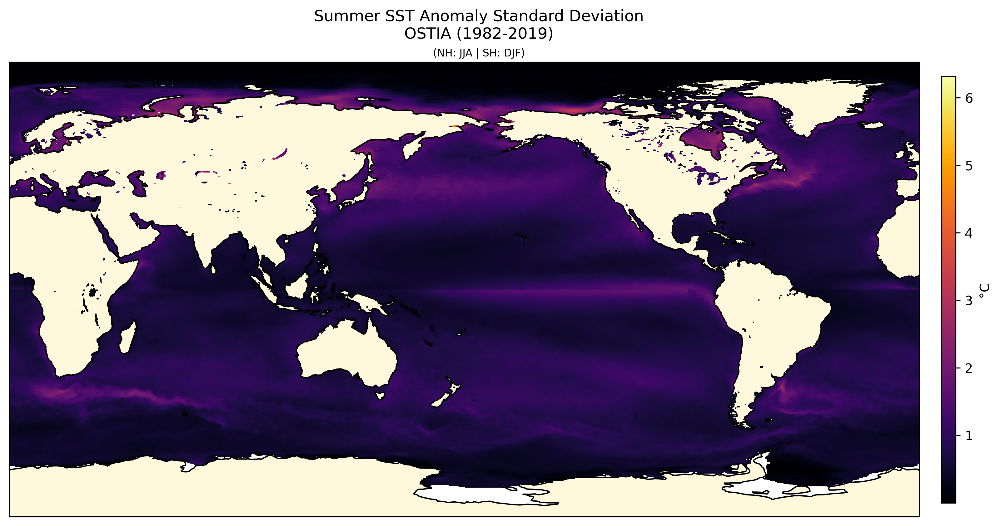

In [5]:
# --------------------------------------------------
# Summer Plot (NH=JJA, SH=DJF)
# --------------------------------------------------
fig = plt.figure(figsize=(12, 6), dpi=300)#,dpi=300)
ax2 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

summer_data = xr.where(std_jja_obs.lat >= 0, std_jja_obs, std_djf_obs)

im2 = summer_data.plot(ax=ax2, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_jja_obs), vmax=np.nanmax(std_jja_obs))

ax2.add_feature(cfeature.LAND, facecolor='cornsilk')
ax2.coastlines()
#ax2.set_title('Summer SST Anomaly Standard Deviation\n(NH: JJA | SH: DJF)', fontsize=12)

fig.text(s='Summer SST Anomaly Standard Deviation\nOSTIA (1982-2019)', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig.text(s='(NH: JJA | SH: DJF)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')

#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax2, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()

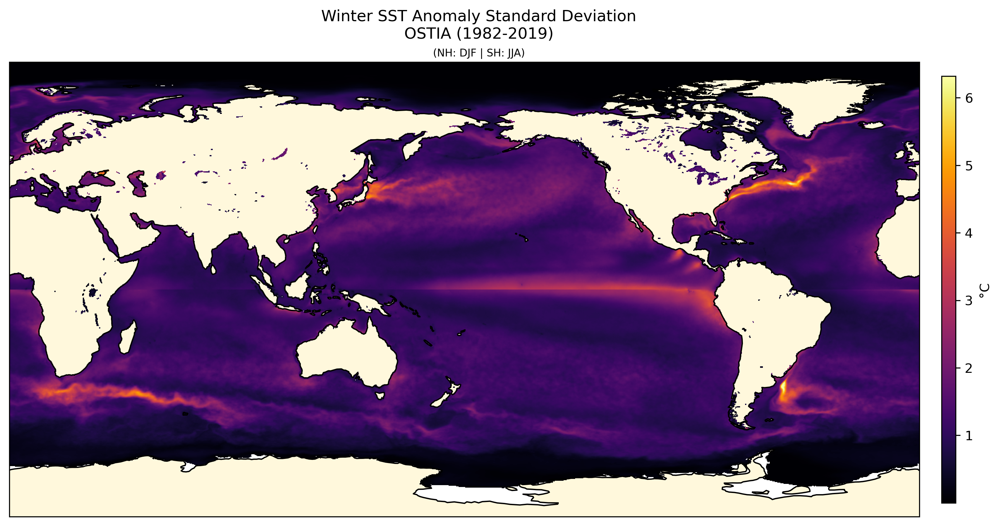

In [6]:
# --------------------------------------------------
# Winter Plot (NH=DJF, SH=JJA)
# --------------------------------------------------
fig1 = plt.figure(figsize=(12, 6), dpi=300)
ax1 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

# Combine hemispheres
winter_data = xr.where(std_djf_obs.lat >= 0, std_djf_obs, std_jja_obs)

# Plot
im1 = winter_data.plot(ax=ax1, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_djf_obs), vmax=np.nanmax(std_djf_obs))

# Decorations
ax1.add_feature(cfeature.LAND, facecolor='cornsilk')
ax1.coastlines()
#ax1.set_title('Winter SST Anomaly Standard Deviation\n(NH: DJF | SH: JJA)', fontsize=12)
fig1.text(s='Winter SST Anomaly Standard Deviation\nOSTIA (1982-2019)', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig1.text(s='(NH: DJF | SH: JJA)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')
#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax1, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()

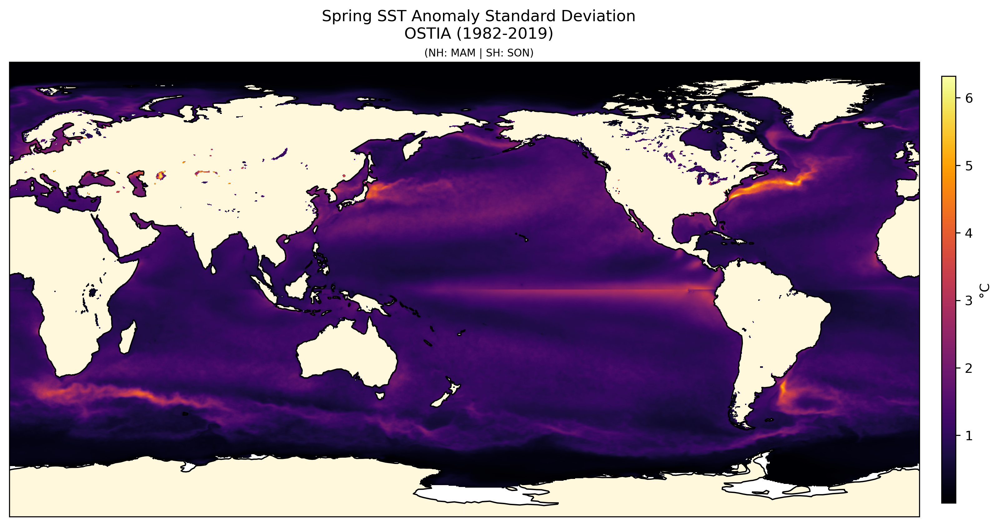

In [7]:
# --------------------------------------------------
# Spring Plot (NH=MAM, SH=SON)
# --------------------------------------------------
fig3 = plt.figure(figsize=(12, 6), dpi=300)
ax3 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

spring_data = xr.where(std_mam_obs.lat >= 0, std_mam_obs, std_son_obs)

im3 = spring_data.plot(ax=ax3, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_mam_obs), vmax=np.nanmax(std_mam_obs))

# Decorations
ax3.add_feature(cfeature.LAND, facecolor='cornsilk')
ax3.coastlines()
#ax3.set_title('Spring SST Anomaly Standard Deviation\n(NH: MAM | SH: SON)', fontsize=12)
#plt.text(15,-0.02,'ICON phase 1 control run', fontsize=12)

fig3.text(s='Spring SST Anomaly Standard Deviation\nOSTIA (1982-2019)', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig3.text(s='(NH: MAM | SH: SON)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')

#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax3, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()


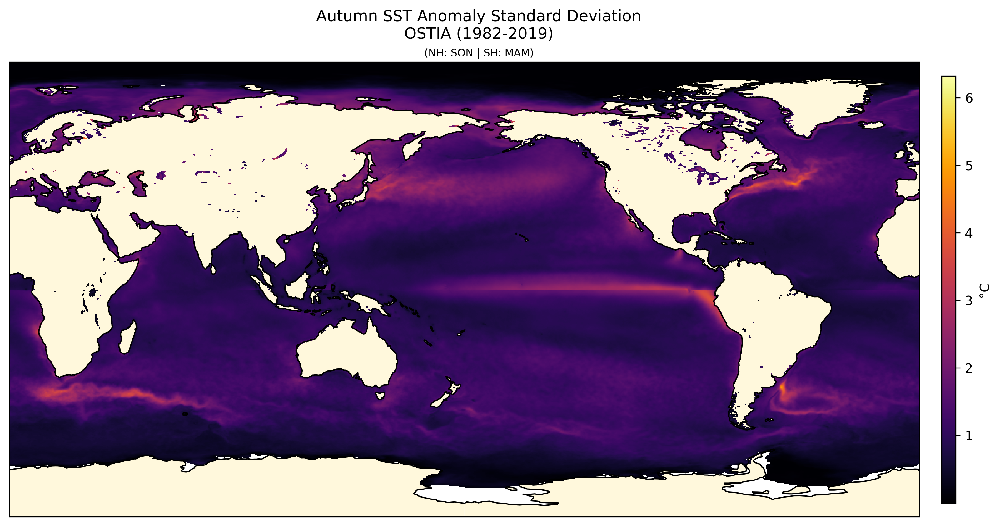

In [8]:

# --------------------------------------------------
# Autumn Plot (NH=SON, SH=MAM)
# --------------------------------------------------
fig4 = plt.figure(figsize=(12, 6), dpi=300)
ax4 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

autumn_data = xr.where(std_son_obs.lat >= 0, std_son_obs, std_mam_obs)

im4 = autumn_data.plot(ax=ax4, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_son_obs), vmax=np.nanmax(std_son_obs))

# Decorations
ax4.add_feature(cfeature.LAND, facecolor='cornsilk')
ax4.coastlines()
#ax4.set_title('Autumn SST Anomaly Standard Deviation\n(NH: SON | SH: MAM)', fontsize=12)
fig4.text(s='Autumn SST Anomaly Standard Deviation\nOSTIA (1982-2019)', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig4.text(s='(NH: SON | SH: MAM)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')
#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax4, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()

## ICON

In [9]:

# Define trimesters and their months
trimesters = {
    'DJF': [12, 1, 2],
    'MAM': [3, 4, 5],
    'JJA': [6, 7, 8],
    'SON': [9, 10, 11]
}

# Calculate and save trimester standard deviations
#for trm, months in trimesters.items():
#    # Mask months while handling December (year boundary)
#    ssta_trm = ssta.sel(time=ssta.time.dt.month.isin(months))
#    std_trm = ssta_trm.std(dim='time', keep_attrs=True)
#    std_trm=std_trm.to_netcdf(f'ssta_std_{trm}.nc')

# Load precomputed standard deviations
std_djf = xr.open_dataarray('ssta_std_DJF.nc')
std_djf=std_djf.compute()
std_mam = xr.open_dataarray('ssta_std_MAM.nc')
std_mam=std_mam.compute()
std_jja = xr.open_dataarray('ssta_std_JJA.nc')
std_jja=std_jja.compute()
std_son = xr.open_dataarray('ssta_std_SON.nc')
std_son=std_son.compute()


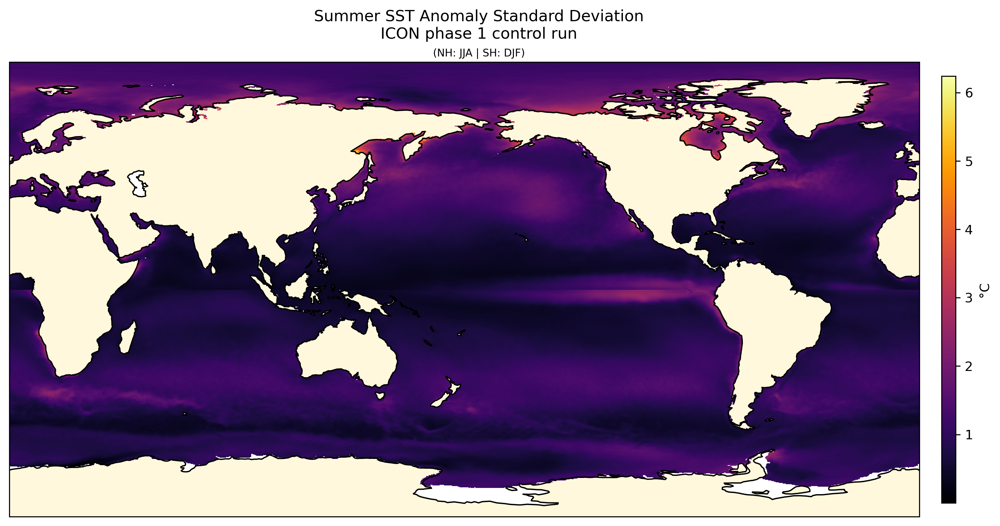

In [15]:
# --------------------------------------------------
# Summer Plot (NH=JJA, SH=DJF)
# --------------------------------------------------
fig = plt.figure(figsize=(12, 6), dpi=300)#,dpi=300)
ax2 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

summer_data = xr.where(std_jja.lat >= 0, std_jja, std_djf)

im2 = summer_data.plot(ax=ax2, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_jja), vmax=np.nanmax(std_jja))

ax2.add_feature(cfeature.LAND, facecolor='cornsilk')
ax2.coastlines()
#ax2.set_title('Summer SST Anomaly Standard Deviation\n(NH: JJA | SH: DJF)', fontsize=12)

fig.text(s='Summer SST Anomaly Standard Deviation\nICON phase 1 control run', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig.text(s='(NH: JJA | SH: DJF)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')

#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax2, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()

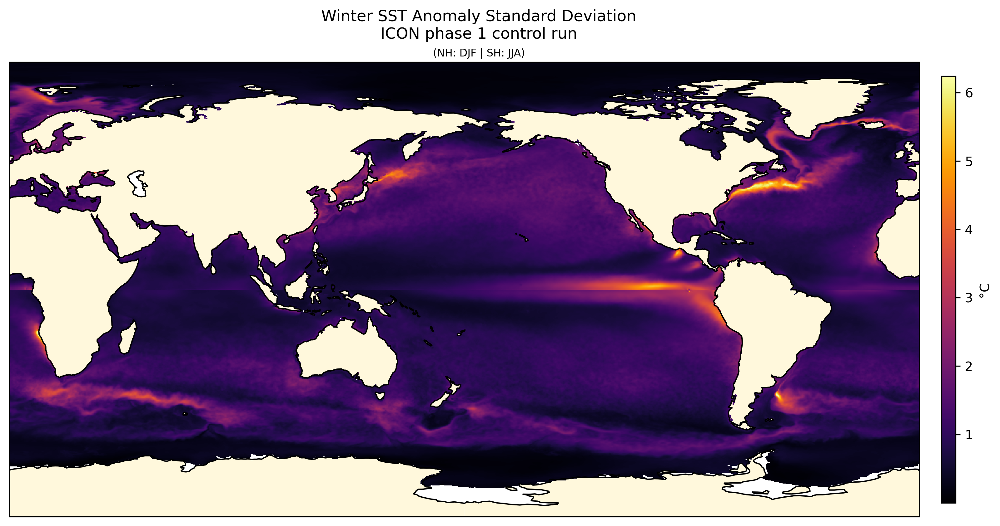

In [11]:
# --------------------------------------------------
# Winter Plot (NH=DJF, SH=JJA)
# --------------------------------------------------
fig1 = plt.figure(figsize=(12, 6), dpi=300)
ax1 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

# Combine hemispheres
winter_data = xr.where(std_djf.lat >= 0, std_djf, std_jja)

# Plot
im1 = winter_data.plot(ax=ax1, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_djf), vmax=np.nanmax(std_djf))

# Decorations
ax1.add_feature(cfeature.LAND, facecolor='cornsilk')
ax1.coastlines()
#ax1.set_title('Winter SST Anomaly Standard Deviation\n(NH: DJF | SH: JJA)', fontsize=12)
fig1.text(s='Winter SST Anomaly Standard Deviation\nICON phase 1 control run', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig1.text(s='(NH: DJF | SH: JJA)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')
#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax1, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()

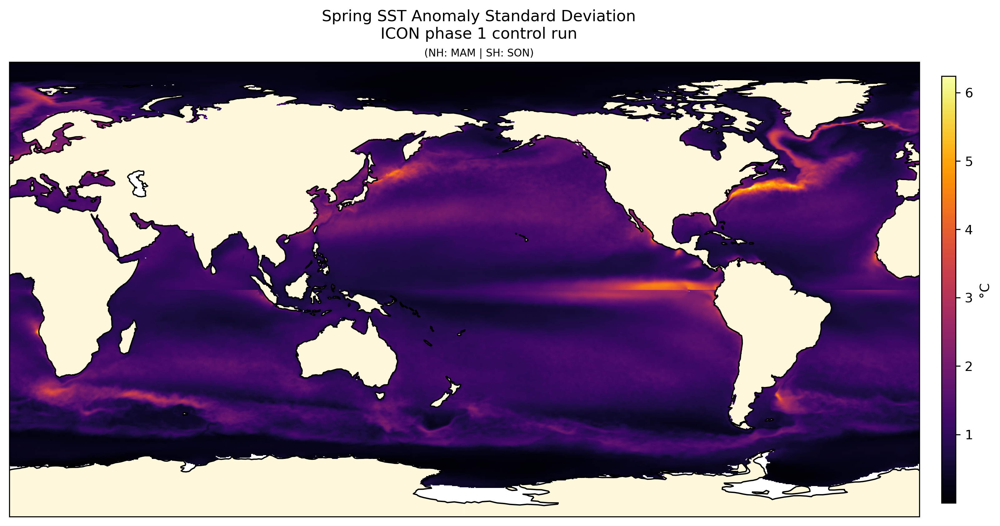

In [12]:
# --------------------------------------------------
# Spring Plot (NH=MAM, SH=SON)
# --------------------------------------------------
fig3 = plt.figure(figsize=(12, 6), dpi=300)
ax3 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

spring_data = xr.where(std_mam.lat >= 0, std_mam, std_son)

im3 = spring_data.plot(ax=ax3, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_mam), vmax=np.nanmax(std_mam))

# Decorations
ax3.add_feature(cfeature.LAND, facecolor='cornsilk')
ax3.coastlines()
#ax3.set_title('Spring SST Anomaly Standard Deviation\n(NH: MAM | SH: SON)', fontsize=12)
#plt.text(15,-0.02,'ICON phase 1 control run', fontsize=12)

fig3.text(s='Spring SST Anomaly Standard Deviation\nICON phase 1 control run', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig3.text(s='(NH: MAM | SH: SON)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')

#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax3, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()


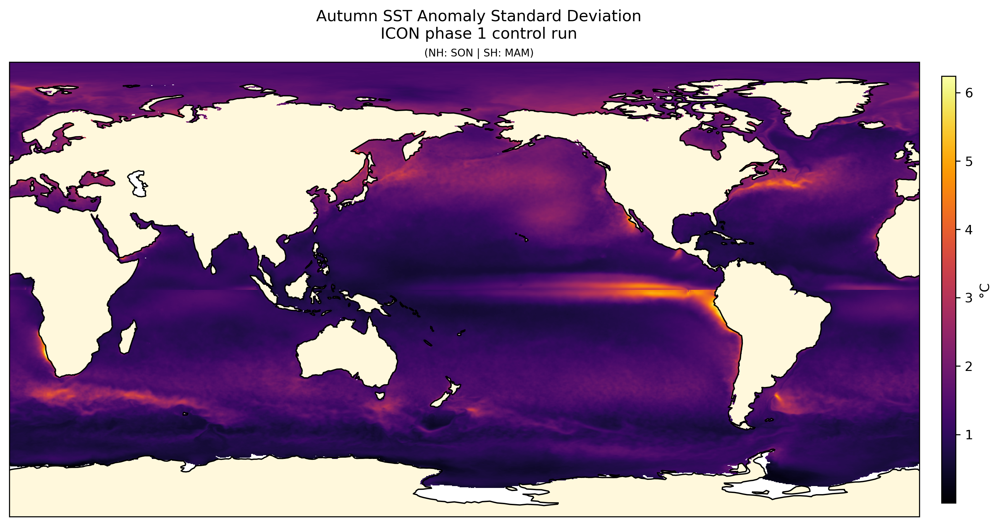

In [13]:

# --------------------------------------------------
# Autumn Plot (NH=SON, SH=MAM)
# --------------------------------------------------
fig4 = plt.figure(figsize=(12, 6), dpi=300)
ax4 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

autumn_data = xr.where(std_son.lat >= 0, std_son, std_mam)

im4 = autumn_data.plot(ax=ax4, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_son), vmax=np.nanmax(std_son))

# Decorations
ax4.add_feature(cfeature.LAND, facecolor='cornsilk')
ax4.coastlines()
#ax4.set_title('Autumn SST Anomaly Standard Deviation\n(NH: SON | SH: MAM)', fontsize=12)
fig4.text(s='Autumn SST Anomaly Standard Deviation\nICON phase 1 control run', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig4.text(s='(NH: SON | SH: MAM)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')
#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax4, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()